In [342]:
import pandas as pd 
import seaborn as sns
from pandas import Series, DataFrame
from matplotlib import pyplot as plt
from sklearn import preprocessing
import pylab
import missingno as msno
import scipy.stats as stats
from scipy.stats import shapiro
import scipy
from numbers import Number
import statsmodels.api as sm
import statsmodels.stats.api as sms
import numpy as np 
from sklearn import tree
from scipy.stats import levene
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage

from scipy.stats import f_oneway
from scipy.stats import pearsonr
import statsmodels.formula.api as smf
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import scale, MinMaxScaler
from sklearn.naive_bayes import MultinomialNB
from scipy.cluster.hierarchy import linkage
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
from skompiler import skompile
from sklearn.preprocessing import scale
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, cross_val_score,GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from matplotlib import pyplot as plt
from sklearn import model_selection
import pandas as pd
from catboost import CatBoostRegressor
from yellowbrick.cluster import KElbowVisualizer
from warnings import filterwarnings
from sklearn.neural_network import MLPRegressor,MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
filterwarnings("ignore")

class Information():
    def __init__(self,data):
        self.data=data
        
    def Describe(self):
        print(self.data.describe().T)
        
    def Info(self):
        print(self.data.info())
        
    def Head(self):
        print(self.data.head())
              
    def ColumnTypes(self):
        print(self.data.dtypes)
              
    def NullValues(self):
        print(self.data.isnull().values.any())
        print(self.data.isnull().sum())
              
    def Count(self):
        print(self.data.count())
              
    def Num_data(self):
        print(self.data.select_dtypes(include=['float64','int64']))
              
    def Cat_data(self):
        print(self.data.select_dtypes(include=["object"]))
              
    def nuniques(self):
        unique = self.data.nunique()
        return unique
        
              
class Visualization():
    def __init__(self,data):
        self.data = data
        
    def barplot(self,x,y,z = None):
        bar = sns.barplot(x = x, y = y, hue = z, data = self.data);
        return bar
    def frekans(self, x):
        fre = self.data[str(x)].value_counts().plot.barh()
        return fre
    
    def catplot(self, x, y, z = None):
        cat = sns.catplot(x = x, y = y, hue = z, data = self.data);
        return cat
    
    def histogram(self,x, y = None):
        hist = sns.FacetGrid(self.data,hue = y,height = 5).map(sns.kdeplot, x, shade= True).add_legend();
        return hist
    
    def boxplot(self,x, y = None, z = None):
        box = sns.boxplot(x = x, y = y, hue = z, data=self.data);
        return box
    
    def crosstab(self, col1, col2, normalize=None):
        return pd.crosstab(index=self.data[str(col1)], columns=self.data[str(col2)])
    
    def violin(self, x , y , z = None):
        vio = sns.catplot(x= x, y = y, hue = z, kind = "violin", data = self.data);
        return vio
    
    def distplot(self, col1):
        dist = sns.distplot(self.data[str(col1)], bins = 10, kde = False);
        return dist
    
    def jointplot(self,x,y):
        joint = sns.jointplot(x = x, y = y ,data = self.data, kind="reg");
        return joint
    
    def scatter(self, x, y, z = None, s = None):
        sca = sns.scatterplot(x = x, y = y, hue=z, size = s, data = self.data);
        return sca
    
    def lmplot(self, x, y, z = None, c = None, r = None):
        lm = sns.lmplot(x = x, y = y, hue = z, col = c, row = r, data = self.data);
        return lm
    
    def pairplot(self, x = None):
        pair = sns.pairplot(self.data, kind = "reg", hue = x);
        return pair
    
    def heatmap(self):
        heat = sns.heatmap(self.data, annot = True, fmt = "d");
        return heat
    
    def corr(self):      
        fig,ax = plt.subplots(figsize=(7, 7))
        sns.heatmap(self.data.corr(), ax=ax, annot=True, linewidths=0.05, fmt= '.2f',cmap="magma")
        plt.show()
    
    def dendogram(self):
        dendogram = msno.dendrogram(self.data)
        return dendogram
    
    def probplot(self, col):
        prob = stats.probplot(self.data[col],dist='norm',plot=pylab)
        pylab.show()
    
    def lineplot(self, x, y, z = None, s = None):
        lin = sns.lineplot(x = x, y = y, hue = z, style = s, markers = True,  dashes = False, data = self.data);
        return lin
    
    def countplot(self, column):
        count = sns.countplot(self.data.iloc[:,column], data = self.data, palette = "Set3");
        return count

    def PieChart(self):
        pie = plt.pie(self.data, labels = self.data.index, counterclock = False, shadow = True)
        return pie 
        
              
class PreProcessing:
    
    def __init__(self, data):
        self.data = data
        
    def dropna(self):
        return self.data.dropna()

    def Delete_col(self, inplace):
        del_col = self.data.dropna(axis=1, inplace=inplace)
        return del_col
    
    def Delete_row(self, inplace):
        del_row = self.data.dropna(axis=0, inplace=inplace)
        return del_row
    
    def calc_vif(self):
        vif["variables"] = self.data.columns
        vif["VIF"] = [variance_inflation_factor(self.data.values, i) for i in range(self.data.shape[1])]
        return(vif)

    def Dummy(self):
        dummy_data = pd.get_dummies(self.data)
        return dummy_data
    
    def normalization(self):
        return preprocessing.normalize(self.data)
    
    def outlier(self):
        lower_and_upper = {}
        columns = list(self.data.select_dtypes(include=["float64","int64"]))
        for col in columns:
            q1 = self.data[col].quantile(0.25)
            q3 = self.data[col].quantile(0.75)
            iqr = 1.5*(q3-q1)
    
            lower_bound = q1-iqr
            upper_bound = q3+iqr
    
            lower_and_upper[col] = (lower_bound, upper_bound)
            self.data.loc[(self.data.loc[:,col]<lower_bound),col]=lower_bound
            self.data.loc[(self.data.loc[:,col]>upper_bound),col]=upper_bound
         
        return self.data

    def DropColumn(self, column):
        drop =  self.data.drop(column, inplace=True, axis=1)
        return drop

    def Label_Encoder(self, column):
        label_encoder = preprocessing.LabelEncoder()
        LE = label_encoder.fit_transform(self.data[column])
        return LE
    
    def standardization(self):
        st_data = preprocessing.scale(self.data)
        return st_data

    
              
class statistic():
    def __init__(self, data):
        self.data=data
        
        
    def shapiro(self):
        for col in self.data.columns[1:]:
            if self.data[col].dtypes != object:
                stat, p = shapiro(self.data[col])
                print('Shapiro Statistics=%.3f, p=%.3f' % (stat, p))
                alpha = 0.05
                if p > alpha:
                    print(col)
                    print('\033[1m'+ col + '\033[0m','Örneklem Normal (Gaussian) dağılımdan gelmektedir (fail to Reject) \n')
                else:
                    print('\033[1m'+ col + ":"+'\033[0m','Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)\n')
        
    def chi2(self,col1,col2): 
        cross=pd.crosstab(index=self.data[col2], columns=self.data[col1])
        chi2,p,dof,expected= stats.chi2_contingency(cross)
        result=[["chi",chi2],["p",p]]
        print(result)
        
    def spearmanr(self, col_1, col_2):
        stats.spearmanr(self.data[col_1],self.data[col_2])
        alpha=0.05
        if(p>alpha):
            print('Statistics=%.3f, p=%.3f' % (stat,p), 'aralarındaki bu ilişki anlamsızdır') 
        else:
            print('Statistics=%.3f, p=%.3f' % (stat,p), 'aralarında bir ilişki vardır ve bu ilişki anlamlıdır')
        
    def ttest_one(self,column,popmean):
        stat, p = self.stats.ttest_one(self.data[column], popmean = popmean)
        print("Statistics:%3.3f, p=%.3f " % (stat,p))
            
    def lev_ttest(self,col1,col2):
        x = Series(self.data[col1].iloc[:][data[col2]==1])
        y = Series(self.data[col1].iloc[:][data[col2]==0])
        print("HİPOTEZ:")
        print("H0:{}-{}=1 and {}-{} =0 have same distribution\n".format(col1,col2,col1,col2))
        stat, p=stats.levene(x,y)
        print("Levene Statistic= {}, p-val={}".format(stat,p))
        if p<0.05:
            print("H0--> Reject. They have different variance\n")
        else:
            print("H0--> Fail to Reject.")
            
        if p<0.05:
            equal_var=False
        else:
            equal_var=True
        print("ttest_two:")
        stat, p=stats.ttest_ind(x,y)
        print("Statistic= {}, p-val={}".format(stat,p))
        if p<0.05:
            print("H0--> Reject. They have different mean\n")
        else:
            print("H0--> Fail to Reject.")
    
    def VIF(self,X):
        vif = pd.DataFrame()
        vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
        vif["features"] = X.columns
        print(vif)
    
    
class Model():
    def __init__(self):
        self.data=data
        
    def train_test_split(self,y,X):
        self.X =X
        self.y =y
        shuffle = input("Please enter shufle: ")
        X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.20,random_state=42,shuffle=shuffle)
        print("X_train",X_train.shape)
        print("y_train",y_train.shape)
        print("X_test",X_test.shape)
        print("y_test",y_test.shape)
        return X_train,X_test,y_train,y_test
    
    def stats_model(self,y,X):
        self.X =X
        self.y =y
        lm = sm.OLS(y,X)
        model = lm.fit()
        print(model.summary())
        
    def stats_model_2(self,y,X):
        self.X =X
        self.y =y
        loj = sm.Logit(self.y,self.X)
        loj1 = loj.fit()
        print(loj1.summary())   
        
    def Linear_Regresyon(self,X_train=None,X_test=None,y_train=None,y_test=None):
        lm=LinearRegression()
        lr=lm.fit(X_train,y_train)
        return lr
        
    def Linear_Regression_PCA(self,X_train=None,X_test=None,y_train=None,y_test=None):
        pca =PCA()
        
        X_reduced_train = pca.fit_transform(scale(X_train))
        X_reduced_test= pca.fit_transform(scale(X_test))
        
        print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)[0:50])
        
        lm = LinearRegression()
        pcr_model = lm.fit(X_reduced_train, y_train)
        y_pred = pcr_model.predict(X_reduced_test)
        print("RMSE  :" , np.sqrt(mean_squared_error(y_test, y_pred)))
        print("r2_score : " , r2_score(y_test, y_pred))
            
    def Logisctic_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None):

        loj =LogisticRegression(solver = "liblinear")
        loj_model = loj.fit(X_train, y_train)
        print(loj_model)
        print("----------------------------Train---------------")
        print(accuracy_score(y_train,loj_model.predict(X_train)))
        print(confusion_matrix(y_train,loj_model.predict(X_train)))
        print(classification_report(y_train,loj_model.predict(X_train)))
        print("-----------------Test--------------")
        y_pred=loj_model.predict(X_test)
        print(accuracy_score(y_test,y_pred))
        print(confusion_matrix(y_test,y_pred))
        print(classification_report(y_test,y_pred))
        
        
        print(loj_model.predict_proba(X_test)[0:10])
        y_probs=loj_model.predict_proba(X_test)
        y_probs=y_probs[:,1]
        y_pred2=[1 if i>0.4 else 0 for i in y_probs]
        print("iyileştirme")
        print(confusion_matrix(y_test,y_pred2))
        print(classification_report(y_test,y_pred2))
        y_probs=loj_model.predict_proba(X_test)
        y_probs=y_probs[:,1]
        y_pred3=[1 if i>0.2 else 0 for i in y_probs]
        
        print("iyileştirme")
        print(confusion_matrix(y_test,y_pred3))
        print(classification_report(y_test,y_pred3))
        
        print("-----------------Test--------------")
        print(cross_val_score(loj_model,X_test,y_test, cv=10).mean())
        
        print("----------------------------Train---------------")
        print(cross_val_score(loj_model,X_train,y_train, cv=10).mean())
        
        

        logit_roc_auc = roc_auc_score(y_test, loj_model.predict(X_test))

        fpr, tpr, thresholds = roc_curve(y_test, loj_model.predict_proba(X_test)[:,1])
        print("-----------------Test--------------")

        plt.figure()
        plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Oranı')
        plt.ylabel('True Positive Oranı')
        plt.title('ROC')
        plt.show()
        
        print("----------------------------Train---------------")
        logit_roc_auc=roc_auc_score(y_train,loj_model.predict(X_train))
        fpr, tpr, thresholds = roc_curve(y_train, loj_model.predict_proba(X_train)[:,1])
        plt.figure()
        plt.plot(fpr, tpr, label='AUC (area = %0.2f)' % logit_roc_auc)
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Oranı')
        plt.ylabel('True Positive Oranı')
        plt.title('ROC')
        plt.show()
        return loj_model
        
        
        
        
    def Model_Tuning(self,X_train= None,y_train = None,params= None,model=None):
        model_cv = GridSearchCV(model, params, cv=10, n_jobs = -1, verbose = 2)
        model_tuned = model_cv.fit(X_train, y_train)
        print("En iyi parametreler: " + str(model_tuned.best_params_))
        return model_tuned.best_params_
        
    def NN_Classification(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        scaler = StandardScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        mlpc = MLPClassifier(**best_params)
        mlpc.fit(X_train_scaled, y_train)
        print(mlpc)
        y_pred = mlpc.predict(X_test_scaled)
        print("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        ("------------------classification_report------------------")
        print(classification_report(y_test, y_pred))
        return mlpc
        
        
    def CART_Classification(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        cart = DecisionTreeClassifier(**best_params)
        cart_model = cart.fit(X_train, y_train)
        print(cart_model)
        
        fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,50), dpi=300)

        tree.plot_tree(cart_model,
           filled = True);

        fig.savefig('tree_class.png')
        print(skompile(cart_model.predict).to("python/code"))
        y_pred = cart_model.predict(X_test)
        print("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        
        print("------------------confusion_matrix------------------")
        print(confusion_matrix(y_test,y_pred))
        return cart
        
    def RF_Classification(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        rf_model = RandomForestClassifier(**best_params).fit(X_train, y_train)
        print(rf_model)
        y_pred = rf_model.predict(X_test)
        print("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        print("------------------confusion_matrix------------------")
        print(confusion_matrix(y_test,y_pred))
        
        Importance = pd.DataFrame({"Importance": rf_model.feature_importances_*100},
                         index = X_train.columns)
        Importance.sort_values(by = "Importance", 
                       axis = 0, 
                       ascending = True).plot(kind ="barh", color = "r")

        plt.xlabel("Değişken Önem Düzeyleri")
        return rf_model
        
    def NN_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        scaler = StandardScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        mlp_model = MLPRegressor(**best_params).fit(X_train_scaled, y_train)
        print(mlp_model)
        y_pred = mlp_model.predict(X_test_scaled)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return mlp_model
        
    def CART_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        cart_model = DecisionTreeRegressor(**best_params)
        cart_model.fit(X_train, y_train)
        fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,50), dpi=300)
        tree.plot_tree(cart_model,
                   filled = True);
        fig.savefig('tree_reg.png')
        
        print(skompile(cart_model.predict).to('python/code'))
        y_pred =cart_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return cart_model
        
        
    def RF_Regression(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        rf_model = RandomForestRegressor(**best_params)
        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        
        Importance = pd.DataFrame({"Importance": rf_model.feature_importances_*100},
                         index = X_train.columns)
        Importance.sort_values(by="Importance", axis=0, ascending=True).plot(kind="barh", color="r")
        plt.xlabel("Degiskenlerin Onem Duzeyleri")
        plt.show()
        return rf_model
        
    def SVR(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        svr = SVR(**best_params).fit(X_train, y_train)
        print(svr)
        y_pred = svr.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return svr
        
    def CatBoostRegressor(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        catb = CatBoostRegressor(**best_params)
        catb_model = catb.fit(X_train, y_train)
        print(catb_model)
        y_pred = catb_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        return catb_model
    
    def KNeighborsRegressor(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        knn_model = KNeighborsRegressor(**best_params).fit(X_train, y_train)
        print(knn_model)
        print(knn_model.n_neighbors)
        print(knn_model.effective_metric_)
        y_pred = knn_model.predict(X_test)
        print("-----------------------------MSE--------------------")
        print(np.sqrt(mean_squared_error(y_test, y_pred)))
        RMSE = [] 
        RMSE_CV = []
        for k in range(10):
            k = k+1
            knn_model = KNeighborsRegressor(n_neighbors = k).fit(X_train, y_train)
            y_pred = knn_model.predict(X_train) 
            rmse = np.sqrt(mean_squared_error(y_train,y_pred)) 
            rmse_cv = np.sqrt(-1*cross_val_score(knn_model, X_train, y_train, cv=10, 
                                         scoring = "neg_mean_squared_error").mean())
            RMSE.append(rmse) 
            RMSE_CV.append(rmse_cv)
            print("k =" , k , "için RMSE değeri: ", rmse, "RMSE_CV değeri: ", rmse_cv )
        return knn_model
    
    def KMEANS(self,X_train=None,X_test=None,y_train=None,y_test=None):
        pca = PCA(n_components=4)
        X_reduced_train = pca.fit_transform(scale(X_train))
        X_reduced_test = pca.fit_transform(scale(X_test))
        pca_data = pca.fit_transform(scale(data))
        pca_data = pd.DataFrame(pca_data)
        print(np.cumsum(np.round(pca.explained_variance_ratio_, decimals = 4) * 100))
        n_cluster = input("Please enter n_cluster: ")
        kmeans = KMeans(n_clusters=n_cluster)
        k_fit = kmeans.fit(pca_data)
        print(k_fit.cluster_centers_)
        print(k_fit.labels_)
        visualizer = KElbowVisualizer(kmeans, k=(2,50))
        visualizer.fit(pca_data)
        visualizer.poof()
        n_cluster = input("Please enter n_cluster: ")
        kmeans = KMeans(n_clusters= n_cluster)
        k_fit = kmeans.fit(pca_data)
        kumeler = k_fit.labels_
        merkezler = k_fit.cluster_centers_
        plt.scatter(pca_data.iloc[:,0], pca_data.iloc[:,1], merkezler, c= kumeler,  cmap = "viridis")
        plt.scatter(merkezler[:,0], merkezler[:,1], c="black", s= 200, alpha = 0.5)
        
    def NaiveBayes(self,X_train=None,X_test=None,y_train=None,y_test=None):
        scaler = MinMaxScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        nb = MultinomialNB()
        nb_model = nb.fit(X_train_scaled, y_train)
        print(nb_model)
        y_pred = nb_model.predict(X_test_scaled)
        print("Test başarı oranı")
        print(accuracy_score(y_test, y_pred))
        y_pred = nb_model.predict(X_train_scaled)
        print("Train başarı oranı")
        print(accuracy_score(y_train, y_pred))
        
    def SVC(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        svc_model = SVC(**best_params)
        svc_model.fit(X_train, y_train)
        print(svc_model)
        y_pred = svc_model.predict(X_test)
        print("Test başarı oranı")
        print(accuracy_score(y_test, y_pred))
        print(classification_report(y_test,svc_model.predict(X_test)))
        y_pred = svc_model.predict(X_train)
        print("Train başarı oranı")
        print(accuracy_score(y_train, y_pred))
        print(classification_report(y_train,svc_model.predict(X_train)))
        return svc_model
        
        
    def KNeighborsClassifier(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        knn = KNeighborsClassifier(**best_params)
        knn_model = knn.fit(X_train, y_train)
        print(knn_model)
        y_pred = knn_model.predict(X_test)
        ("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        print(classification_report(y_test, y_pred))
        return knn_model
        
    def CatBoostClassifier(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        cat_model = CatBoostClassifier(**best_params).fit(X_train, y_train)
        y_pred = cat_model.predict(X_test)
        ("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        ("------------------classification_report------------------")
        print(classification_report(y_test, y_pred))
        return cat_model
        
    def GradientBoostingClassifier(self,X_train=None,X_test=None,y_train=None,y_test=None,best_params=None):
        gbm_model = GradientBoostingClassifier(**best_params).fit(X_train, y_train)
        y_pred = gbm_model.predict(X_test)
        ("------------------Accuracy Score------------------")
        print(accuracy_score(y_test, y_pred))
        ("------------------classification_report------------------")
        print(classification_report(y_test, y_pred))
        return gbm_model
    
    def Testing(modeller=None,X_test=None,y_test=None):
        for model in modeller:
            isimler = model.__class__.__name__
            y_pred = model.predict(X_test)
            dogruluk = accuracy_score(y_test, y_pred)
            print("-"*28)
            print(isimler + ":" )
            print("Accuracy: {:.4%}".format(dogruluk))
  

In [295]:
data1 = pd.read_excel("HW_Data_Set.xlsx")
data=data1.copy()

Forex / Finans veriseti 

In [296]:
inf_data = Information(data)
#Data hakkında ön bilgi alınan sınıf

In [297]:
inf_data.Head()

   ind_5  ind_6  ind_8      ind_9     ind_10     ind_12     ind_13  ind_14  \
0     19     17  100.0  85.714286  14.285714  72.363515  60.808814   23.80   
1     24     19  100.0  78.571429  21.428571  74.275883  64.366798   11.45   
2     30     24  100.0  71.428571  28.571429  75.140402  65.915803    8.75   
3     37     30  100.0  64.285714  35.714286  76.677846  68.584234    7.80   
4     41     37  100.0  57.142857  42.857143  81.603007  76.455495   14.90   

   ind_15  ind_16  ...  ind_416  ind_418  ind_420  ind_422  ind_424   ind_426  \
0   17.62   11.73  ...    -49.6      -54     -152     -353      1.0  0.498547   
1   18.16   12.22  ...    -55.6      -60     -158     -359      1.0  0.537088   
2   17.86   12.28  ...    -58.4      -60     -160     -362      1.0  0.615169   
3   14.76   12.61  ...    -61.8      -65     -166     -367      1.0  0.661517   
4   11.92   14.25  ...    -79.8      -86     -186     -388      1.0  0.747204   

    ind_428  20_target  50_target  90_target

In [298]:
inf_data.Info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6167 entries, 0 to 6166
Columns: 136 entries, ind_5 to 90_target
dtypes: float64(88), int64(45), object(3)
memory usage: 6.4+ MB
None


In [299]:
inf_data.Describe()

            count       mean        std         min        25%        50%  \
ind_5      6167.0  -0.803146  23.624403 -131.000000 -14.000000   0.000000   
ind_6      6167.0  -0.803470  23.624144 -131.000000 -14.000000   0.000000   
ind_8      6167.0  48.388890  36.388526    0.000000  14.285714  50.000000   
ind_9      6167.0  48.289282  36.478009    0.000000  14.285714  50.000000   
ind_10     6167.0   0.099609  60.414625 -100.000000 -50.000000   0.000000   
...           ...        ...        ...         ...        ...        ...   
ind_426    6167.0   0.498188   0.228547    0.000000   0.323783   0.495192   
ind_428    6167.0   0.490174   0.150483    0.083530   0.379894   0.487078   
20_target  6167.0  -0.057102  14.834497  -15.780588 -15.350354   0.000000   
50_target  6167.0  -2.906358  34.559778  -37.142889 -36.208094 -34.267756   
90_target  6167.0  -3.315072  36.841541  -38.573858 -37.695273 -35.788391   

                 75%         max  
ind_5      13.000000   76.000000  
ind_6

In [300]:
inf_data.ColumnTypes()

ind_5          int64
ind_6          int64
ind_8        float64
ind_9        float64
ind_10       float64
              ...   
ind_426      float64
ind_428      float64
20_target    float64
50_target    float64
90_target    float64
Length: 136, dtype: object


In [301]:
inf_data.NullValues()

False
ind_5        0
ind_6        0
ind_8        0
ind_9        0
ind_10       0
            ..
ind_426      0
ind_428      0
20_target    0
50_target    0
90_target    0
Length: 136, dtype: int64


In [302]:
inf_data.Count()

ind_5        6167
ind_6        6167
ind_8        6167
ind_9        6167
ind_10       6167
             ... 
ind_426      6167
ind_428      6167
20_target    6167
50_target    6167
90_target    6167
Length: 136, dtype: int64


In [303]:
inf_data.Num_data()

      ind_5  ind_6       ind_8      ind_9     ind_10     ind_12     ind_13  \
0        19     17  100.000000  85.714286  14.285714  72.363515  60.808814   
1        24     19  100.000000  78.571429  21.428571  74.275883  64.366798   
2        30     24  100.000000  71.428571  28.571429  75.140402  65.915803   
3        37     30  100.000000  64.285714  35.714286  76.677846  68.584234   
4        41     37  100.000000  57.142857  42.857143  81.603007  76.455495   
...     ...    ...         ...        ...        ...        ...        ...   
6162     27     31   57.142857  28.571429  28.571429  60.010531  32.362582   
6163     22     27   50.000000  21.428571  28.571429  60.209998  32.914628   
6164     19     22   42.857143  14.285714  28.571429  64.329611  43.550592   
6165     19     19  100.000000   7.142857  92.857143  69.027764  54.130755   
6166     19     19   92.857143   0.000000  92.857143  65.157180  45.524973   

      ind_14  ind_15  ind_16  ...   ind_412  ind_414  ind_416  

In [304]:
inf_data.Cat_data()

     ind_109 ind_420 ind_422
0      GREEN    -152    -353
1      GREEN    -158    -359
2      GREEN    -160    -362
3      GREEN    -166    -367
4      GREEN    -186    -388
...      ...     ...     ...
6162     RED     -11    -270
6163     RED     -12    -271
6164   GREEN     -21    -280
6165   GREEN     -33    -292
6166   GREEN     -28    -288

[6167 rows x 3 columns]


In [305]:
inf_data.nuniques()

ind_5         162
ind_6         162
ind_8          15
ind_9          15
ind_10         29
             ... 
ind_426      5632
ind_428      5901
20_target    4427
50_target    4355
90_target    4487
Length: 136, dtype: int64

In [306]:
data = data.replace('?',np.nan)
data = data.dropna(axis=0, subset=['ind_422'])
data = data.dropna(axis=0, subset=['ind_420'])

In [307]:
data.corr()

,ind_5,ind_6,ind_8,ind_9,ind_10,ind_12,ind_13,ind_14,ind_15,ind_16,...,ind_416,ind_418,ind_420,ind_422,ind_424,ind_426,ind_428,20_target,50_target,90_target
ind_5,1.000000,0.990115,0.547483,-0.518832,0.644215,0.820822,0.777479,-0.045803,-0.067730,-0.092888,...,-0.324564,-0.587574,-0.317846,-0.329648,0.078010,0.621468,0.816156,0.052210,0.081537,0.073107
ind_6,0.990115,1.000000,0.521053,-0.479383,0.604380,0.767504,0.722541,-0.034480,-0.057776,-0.086007,...,-0.299246,-0.536726,-0.320019,-0.331171,0.023117,0.562515,0.809119,0.052347,0.081567,0.073585
ind_8,0.547483,0.521053,1.000000,-0.369578,0.826063,0.585052,0.480337,0.146128,0.119751,0.016810,...,-0.268403,-0.421079,-0.144740,-0.159317,0.142893,0.595508,0.458084,-0.016948,0.001962,-0.011621
ind_9,-0.518832,-0.479383,-0.369578,1.000000,-0.828971,-0.602616,-0.560931,0.260789,0.263371,0.172689,...,0.346778,0.504424,0.131142,0.160855,-0.180249,-0.639987,-0.439689,-0.023754,-0.005618,0.013177
ind_10,0.644215,0.604380,0.826063,-0.828971,1.000000,0.717645,0.629334,-0.070218,-0.087661,-0.094621,...,-0.371881,-0.559393,-0.166660,-0.193456,0.195333,0.746605,0.542404,0.004207,0.004588,-0.014987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ind_426,0.621468,0.562515,0.595508,-0.639987,0.746605,0.775348,0.699661,-0.095876,-0.100360,-0.087605,...,-0.370107,-0.583362,-0.170756,-0.204524,0.341137,1.000000,0.580932,0.023080,0.016545,0.003437
ind_428,0.816156,0.809119,0.458084,-0.439689,0.542404,0.808156,0.729684,-0.006137,-0.019001,-0.035110,...,-0.281079,-0.459643,-0.327875,-0.358164,0.189822,0.580932,1.000000,0.041987,0.068053,0.058844
20_target,0.052210,0.052347,-0.016948,-0.023754,0.004207,0.034990,0.041982,0.001557,0.001838,0.025399,...,-0.004466,-0.044326,-0.001936,-0.035405,0.002466,0.023080,0.041987,1.000000,0.372915,0.344982
50_target,0.081537,0.081567,0.001962,-0.005618,0.004588,0.065218,0.057671,0.075191,0.087573,0.107244,...,0.041196,-0.114093,-0.030940,0.003000,-0.001411,0.016545,0.068053,0.372915,1.000000,0.935970


In [308]:
pro_data = PreProcessing(data)
dummy = pro_data.Dummy()

In [309]:
dummy.head()

,ind_5,ind_6,ind_8,ind_9,ind_10,ind_12,ind_13,ind_14,ind_15,ind_16,...,ind_420,ind_422,ind_424,ind_426,ind_428,20_target,50_target,90_target,ind_109_GREEN,ind_109_RED
0,19,17,100.0,85.714286,14.285714,72.363515,60.808814,23.80,17.62,11.73,...,-152.0,-353.0,1.0,0.498547,0.701906,15.135802,35.625252,36.997753,1,0
1,24,19,100.0,78.571429,21.428571,74.275883,64.366798,11.45,18.16,12.22,...,-158.0,-359.0,1.0,0.537088,0.690833,15.143348,35.643013,37.016198,1,0
2,30,24,100.0,71.428571,28.571429,75.140402,65.915803,8.75,17.86,12.28,...,-160.0,-362.0,1.0,0.615169,0.693040,15.146870,35.651301,-37.024805,1,0
3,37,30,100.0,64.285714,35.714286,76.677846,68.584234,7.80,14.76,12.61,...,-166.0,-367.0,1.0,0.661517,0.673418,15.153283,0.000000,-37.040483,1,0
4,41,37,100.0,57.142857,42.857143,81.603007,76.455495,14.90,11.92,14.25,...,-186.0,-388.0,1.0,0.747204,0.700522,-15.179065,-35.727079,-37.103503,1,0


In [310]:
data = dummy
data

,ind_5,ind_6,ind_8,ind_9,ind_10,ind_12,ind_13,ind_14,ind_15,ind_16,...,ind_420,ind_422,ind_424,ind_426,ind_428,20_target,50_target,90_target,ind_109_GREEN,ind_109_RED
0,19,17,100.000000,85.714286,14.285714,72.363515,60.808814,23.80,17.62,11.73,...,-152.0,-353.0,1.000000,0.498547,0.701906,15.135802,35.625252,36.997753,1,0
1,24,19,100.000000,78.571429,21.428571,74.275883,64.366798,11.45,18.16,12.22,...,-158.0,-359.0,1.000000,0.537088,0.690833,15.143348,35.643013,37.016198,1,0
2,30,24,100.000000,71.428571,28.571429,75.140402,65.915803,8.75,17.86,12.28,...,-160.0,-362.0,1.000000,0.615169,0.693040,15.146870,35.651301,-37.024805,1,0
3,37,30,100.000000,64.285714,35.714286,76.677846,68.584234,7.80,14.76,12.61,...,-166.0,-367.0,1.000000,0.661517,0.673418,15.153283,0.000000,-37.040483,1,0
4,41,37,100.000000,57.142857,42.857143,81.603007,76.455495,14.90,11.92,14.25,...,-186.0,-388.0,1.000000,0.747204,0.700522,-15.179065,-35.727079,-37.103503,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6162,27,31,57.142857,28.571429,28.571429,60.010531,32.362582,9.70,9.38,13.66,...,-11.0,-270.0,0.270270,0.840000,0.600846,14.673247,-34.536532,-35.867088,0,1
6163,22,27,50.000000,21.428571,28.571429,60.209998,32.914628,7.65,8.84,11.79,...,-12.0,-271.0,0.000000,0.737470,0.527673,14.673750,-34.537716,-35.868318,0,1
6164,19,22,42.857143,14.285714,28.571429,64.329611,43.550592,8.95,9.06,10.30,...,-21.0,-280.0,0.769231,0.632107,0.551759,-14.684566,-34.563173,-35.894755,1,0
6165,19,19,100.000000,7.142857,92.857143,69.027764,54.130755,13.55,10.36,10.55,...,-33.0,-292.0,1.000000,0.733010,0.591584,-14.699280,-34.597806,-35.930723,1,0


In [311]:
data = data.drop(columns=['20_target', '50_target'])
#Target degişken olarak 90_target seçildi.

In [234]:
viz_data = Visualization(data)

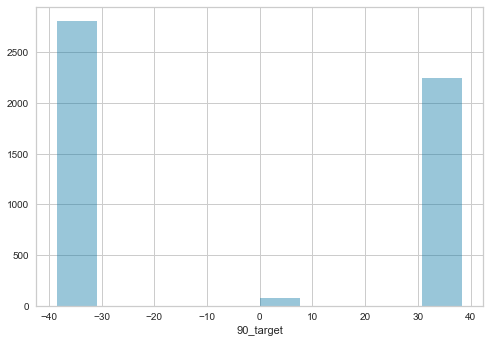

In [235]:
viz_data.distplot("90_target")

In [236]:
cor = data.corr()["90_target"].abs()
cor

ind_5            0.073107
ind_6            0.073585
ind_8            0.011621
ind_9            0.013177
ind_10           0.014987
                   ...   
ind_426          0.003437
ind_428          0.058844
90_target        1.000000
ind_109_GREEN    0.026945
ind_109_RED      0.026945
Name: 90_target, Length: 135, dtype: float64

In [76]:
corr = cor.nlargest(10).index
corr

Index(['90_target', 'ind_18', 'ind_324', 'ind_412', 'ind_17', 'ind_315',
       'ind_16', 'ind_418', 'ind_77', 'ind_332'],
      dtype='object')

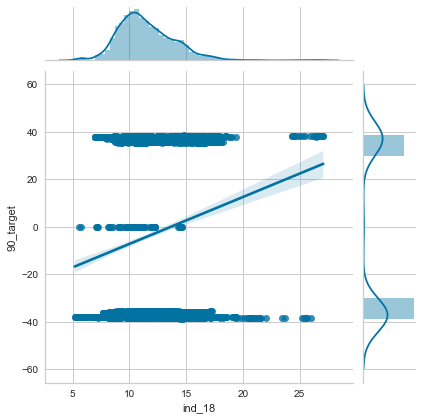

In [77]:
viz_data.jointplot(x="ind_18",y="90_target")

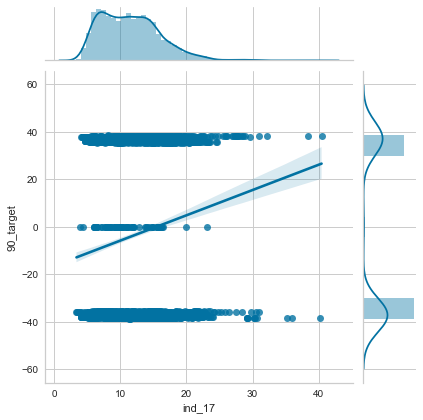

In [78]:
viz_data.jointplot(x="ind_17",y="90_target")

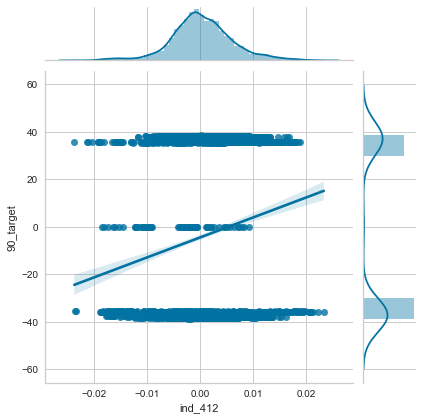

In [79]:
viz_data.jointplot(x="ind_412",y="90_target")

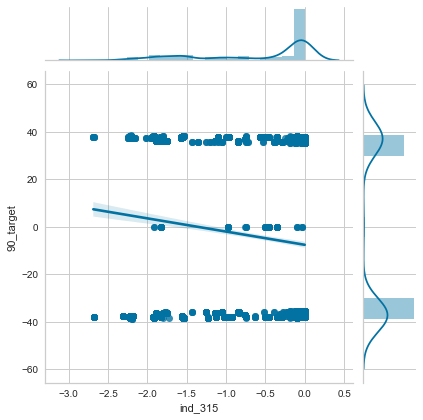

In [80]:
viz_data.jointplot(x="ind_315",y="90_target")

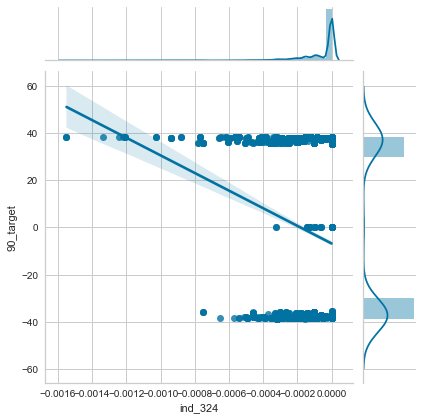

In [81]:
viz_data.jointplot(x="ind_324",y="90_target")

In [82]:
new_data = data[['ind_18', 'ind_324', 'ind_412', 'ind_17', 'ind_315','ind_16', 'ind_418', 'ind_77', 'ind_332']]
new_data.corr()

,ind_18,ind_324,ind_412,ind_17,ind_315,ind_16,ind_418,ind_77,ind_332
ind_18,1.000000,-0.247839,-0.037236,0.519406,-0.308114,0.397056,-0.364201,0.087033,0.081775
ind_324,-0.247839,1.000000,-0.271897,-0.129447,0.339597,-0.064688,0.412388,-0.396448,-0.180743
ind_412,-0.037236,-0.271897,1.000000,-0.047126,-0.028020,-0.031548,-0.317183,0.422127,0.116092
ind_17,0.519406,-0.129447,-0.047126,1.000000,-0.161937,0.921632,-0.403946,-0.004318,0.022079
ind_315,-0.308114,0.339597,-0.028020,-0.161937,1.000000,-0.145599,0.162454,-0.246071,-0.057487
ind_16,0.397056,-0.064688,-0.031548,0.921632,-0.145599,1.000000,-0.339586,-0.006383,0.001329
ind_418,-0.364201,0.412388,-0.317183,-0.403946,0.162454,-0.339586,1.000000,-0.393054,-0.170422
ind_77,0.087033,-0.396448,0.422127,-0.004318,-0.246071,-0.006383,-0.393054,1.000000,0.316005
ind_332,0.081775,-0.180743,0.116092,0.022079,-0.057487,0.001329,-0.170422,0.316005,1.000000


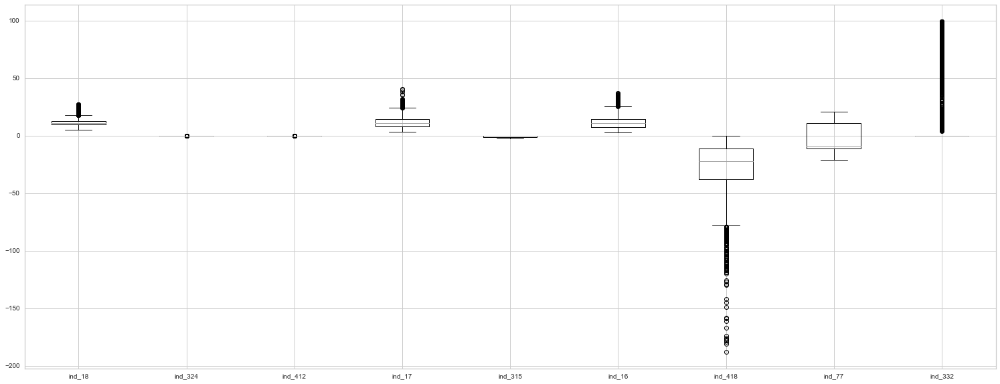

In [83]:
plt.figure(figsize=(26,10))
new_data.boxplot()
plt.show()

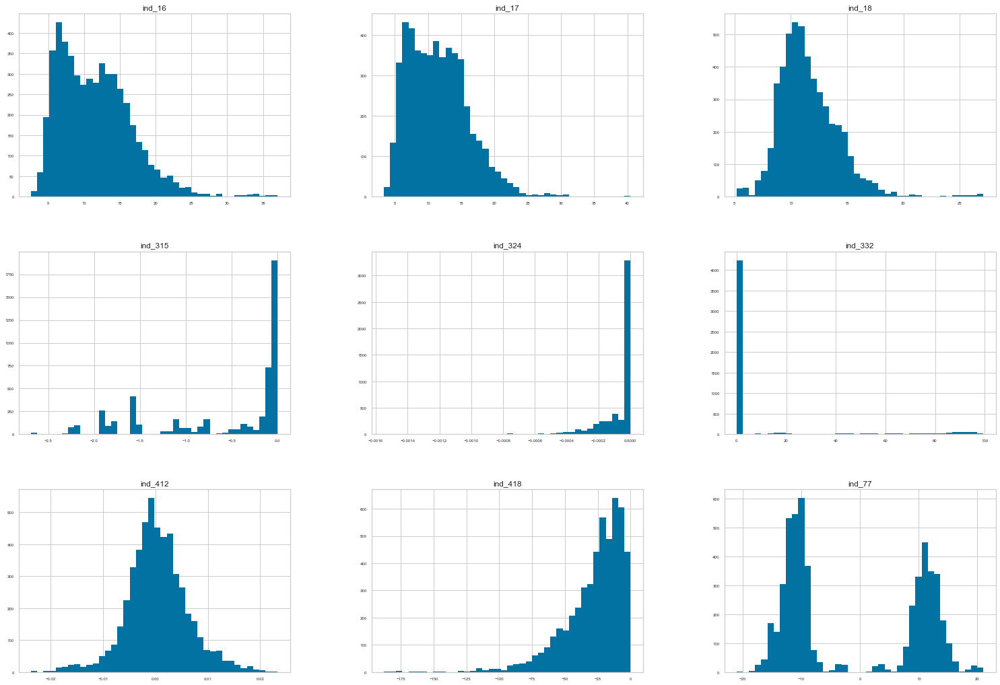

In [84]:
new_data.hist(figsize=(26,18), bins=40, xlabelsize=6, ylabelsize=6)
plt.show()

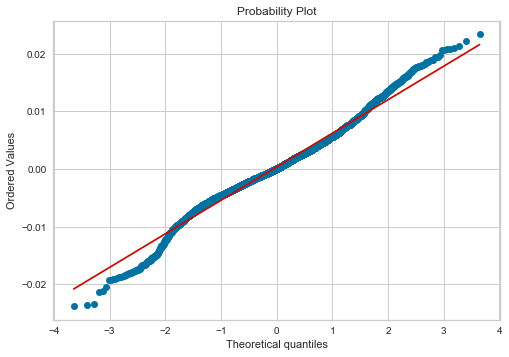

In [85]:
stats.probplot(new_data["ind_412"], dist = "norm", plot=pylab)
pylab.show()

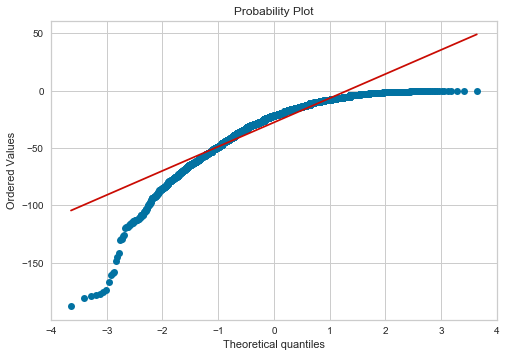

In [86]:
stats.probplot(new_data["ind_418"], dist = "norm", plot=pylab)
pylab.show()

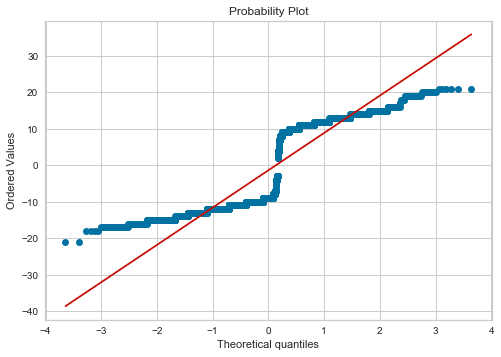

In [87]:
stats.probplot(new_data["ind_77"], dist = "norm", plot=pylab)
pylab.show()

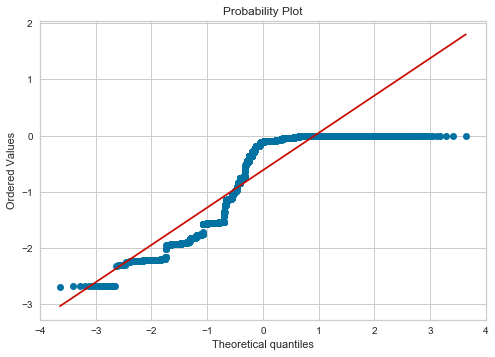

In [88]:
stats.probplot(new_data["ind_315"], dist = "norm", plot=pylab)
pylab.show()

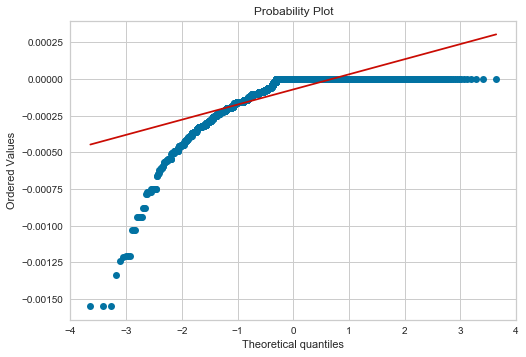

In [89]:
stats.probplot(new_data["ind_324"], dist = "norm", plot=pylab)
pylab.show()

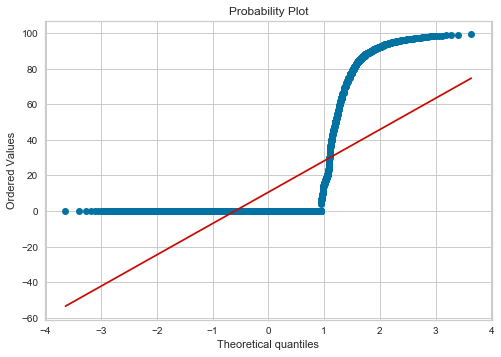

In [90]:
stats.probplot(new_data["ind_332"], dist = "norm", plot=pylab)
pylab.show()

In [170]:
stat_data = statistic(data)

In [171]:
stat_data.shapiro()

Shapiro Statistics=0.970, p=0.000
ind_6: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.893, p=0.000
ind_8: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.889, p=0.000
ind_9: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.942, p=0.000
ind_10: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.996, p=0.000
ind_12: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.828, p=0.000
ind_13: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.863, p=0.000
ind_14: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.917, p=0.000
ind_15: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.944, p=0.000
ind_16: Örneklem Normal (Gaussian) dağılımdan gelmemektedir (Reject H0)

Shapiro Statistics=0.953, p=0.000
ind_17

# Linear Regression

In [312]:
y=data["90_target"]
X=data.drop(["ind_109_RED","90_target"],axis=1).astype("float64")
X.head()

,ind_5,ind_6,ind_8,ind_9,ind_10,ind_12,ind_13,ind_14,ind_15,ind_16,...,ind_412,ind_414,ind_416,ind_418,ind_420,ind_422,ind_424,ind_426,ind_428,ind_109_GREEN
0,19.0,17.0,100.0,85.714286,14.285714,72.363515,60.808814,23.80,17.62,11.73,...,0.002371,2.0,-49.6,-54.0,-152.0,-353.0,1.0,0.498547,0.701906,1.0
1,24.0,19.0,100.0,78.571429,21.428571,74.275883,64.366798,11.45,18.16,12.22,...,0.003074,0.8,-55.6,-60.0,-158.0,-359.0,1.0,0.537088,0.690833,1.0
2,30.0,24.0,100.0,71.428571,28.571429,75.140402,65.915803,8.75,17.86,12.28,...,0.003561,2.7,-58.4,-60.0,-160.0,-362.0,1.0,0.615169,0.693040,1.0
3,37.0,30.0,100.0,64.285714,35.714286,76.677846,68.584234,7.80,14.76,12.61,...,0.004366,0.9,-61.8,-65.0,-166.0,-367.0,1.0,0.661517,0.673418,1.0
4,41.0,37.0,100.0,57.142857,42.857143,81.603007,76.455495,14.90,11.92,14.25,...,0.004198,0.1,-79.8,-86.0,-186.0,-388.0,1.0,0.747204,0.700522,1.0


In [313]:
model = Model()

In [314]:
X_train,X_test,y_train,y_test= model.train_test_split(y,X)

Please enter shufle: 
X_train (4100, 133)
y_train (4100,)
X_test (1026, 133)
y_test (1026,)


In [240]:
model.stats_model(y_train,X_train)

                                 OLS Regression Results                                
Dep. Variable:              90_target   R-squared (uncentered):                   0.222
Model:                            OLS   Adj. R-squared (uncentered):              0.196
Method:                 Least Squares   F-statistic:                              8.513
Date:                Sun, 23 Aug 2020   Prob (F-statistic):                   3.94e-135
Time:                        16:32:21   Log-Likelihood:                         -20094.
No. Observations:                4100   AIC:                                  4.045e+04
Df Residuals:                    3967   BIC:                                  4.129e+04
Df Model:                         133                                                  
Covariance Type:            nonrobust                                                  
                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

In [315]:
y=data["90_target"]
X= new_data
X.head()

,ind_18,ind_324,ind_412,ind_17,ind_315,ind_16,ind_418,ind_77,ind_332
0,9.1100,-0.000062,0.002371,12.060000,-0.756946,11.73,-54,8,20.967742
1,9.2225,-0.000062,0.003074,11.326667,-0.756569,12.22,-60,8,20.800000
2,9.3125,-0.000062,0.003561,10.973333,-0.756393,12.28,-60,8,20.634921
3,9.4150,-0.000062,0.004366,10.426667,-0.756073,12.61,-65,8,20.472441
4,9.8925,-0.000062,0.004198,11.406667,-0.754789,14.25,-86,8,20.312500


In [316]:
model = Model()

In [317]:
X_train,X_test,y_train,y_test= model.train_test_split(y,X)

Please enter shufle: 
X_train (4100, 9)
y_train (4100,)
X_test (1026, 9)
y_test (1026,)


In [100]:
model.stats_model(y_train,X_train)

                                 OLS Regression Results                                
Dep. Variable:              90_target   R-squared (uncentered):                   0.047
Model:                            OLS   Adj. R-squared (uncentered):              0.045
Method:                 Least Squares   F-statistic:                              22.55
Date:                Sun, 23 Aug 2020   Prob (F-statistic):                    7.65e-38
Time:                        14:41:57   Log-Likelihood:                         -20509.
No. Observations:                4100   AIC:                                  4.104e+04
Df Residuals:                    4091   BIC:                                  4.109e+04
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [318]:
X_train = X_train.drop(["ind_16","ind_418", "ind_77"],axis=1)

In [319]:
X_test=X_test.drop(["ind_16","ind_418", "ind_77"],axis=1)

In [103]:
model.Linear_Regression_PCA(X_train,X_test,y_train,y_test)

[ 31.93  53.37  68.71  83.01  92.72 100.  ]
RMSE  : 36.71633077317118
r2_score :  0.0069520238134728185


# NN REGRESSİON

In [50]:
best_params = {}
mlpr = model.NN_Regression(X_train,X_test,y_train,y_test,best_params)

MLPRegressor(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(100,), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_iter=200,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)
-----------------------------MSE--------------------
34.81423403131284


In [51]:
params = {'alpha': [0.1, 0.01,0.02,0.005],
             'hidden_layer_sizes': [(20,20),(100,50,150),(300,200,150)],
             'activation': ['relu','logistic']}
best_params = model.Model_Tuning(X_train,y_train,params,mlpr)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 14.0min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed: 22.6min finished


En iyi parametreler: {'activation': 'relu', 'alpha': 0.02, 'hidden_layer_sizes': (300, 200, 150)}


In [52]:
mlpr = model.NN_Regression(X_train,X_test,y_train,y_test,best_params)                


MLPRegressor(activation='relu', alpha=0.02, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(300, 200, 150), learning_rate='constant',
             learning_rate_init=0.001, max_fun=15000, max_iter=200,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)
-----------------------------MSE--------------------
28.73681795470033


# CatBoostRegressor

In [105]:
best_params = {}
cat = model.CatBoostRegressor(X_train,X_test,y_train,y_test,best_params)

Learning rate set to 0.050174
0:	learn: 36.3728880	total: 3.66ms	remaining: 3.66s
1:	learn: 36.1610778	total: 6.7ms	remaining: 3.34s
2:	learn: 35.9587957	total: 9.82ms	remaining: 3.26s
3:	learn: 35.7914741	total: 13ms	remaining: 3.24s
4:	learn: 35.5791161	total: 16.2ms	remaining: 3.23s
5:	learn: 35.3771223	total: 19.6ms	remaining: 3.25s
6:	learn: 35.2418939	total: 22.6ms	remaining: 3.21s
7:	learn: 35.0987870	total: 25.7ms	remaining: 3.19s
8:	learn: 35.0037334	total: 29ms	remaining: 3.2s
9:	learn: 34.8860926	total: 32.1ms	remaining: 3.18s
10:	learn: 34.7487700	total: 35.5ms	remaining: 3.19s
11:	learn: 34.6489812	total: 38.6ms	remaining: 3.18s
12:	learn: 34.5360957	total: 41.8ms	remaining: 3.17s
13:	learn: 34.4022198	total: 44.8ms	remaining: 3.15s
14:	learn: 34.3009680	total: 48ms	remaining: 3.15s
15:	learn: 34.1869755	total: 51.2ms	remaining: 3.15s
16:	learn: 34.0776766	total: 54.4ms	remaining: 3.14s
17:	learn: 33.9967425	total: 58.3ms	remaining: 3.18s
18:	learn: 33.9140971	total: 61.6m

In [106]:
params = {
    'iterations': [200,500,1000,2000],
    'learning_rate': [0.01, 0.03, 0.05, 0.1],
    'depth': [3,4,5,6,7,8] }

best_params = model.Model_Tuning(X_train,y_train,params,cat)

Fitting 10 folds for each of 96 candidates, totalling 960 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 31.6min
[Parallel(n_jobs=-1)]: Done 960 out of 960 | elapsed: 69.7min finished


0:	learn: 36.0641817	total: 8.73ms	remaining: 17.5s
1:	learn: 35.6470499	total: 15.3ms	remaining: 15.3s
2:	learn: 35.2733716	total: 21.7ms	remaining: 14.4s
3:	learn: 34.8727665	total: 32ms	remaining: 15.9s
4:	learn: 34.5117552	total: 39.4ms	remaining: 15.7s
5:	learn: 34.2079707	total: 46.6ms	remaining: 15.5s
6:	learn: 33.8164782	total: 53.5ms	remaining: 15.2s
7:	learn: 33.5571959	total: 64.8ms	remaining: 16.1s
8:	learn: 33.2013715	total: 72.1ms	remaining: 16s
9:	learn: 32.9007604	total: 79.9ms	remaining: 15.9s
10:	learn: 32.5449405	total: 87ms	remaining: 15.7s
11:	learn: 32.3269484	total: 97ms	remaining: 16.1s
12:	learn: 32.1022834	total: 118ms	remaining: 18s
13:	learn: 31.9360928	total: 125ms	remaining: 17.7s
14:	learn: 31.7795360	total: 132ms	remaining: 17.5s
15:	learn: 31.5896942	total: 140ms	remaining: 17.3s
16:	learn: 31.4109867	total: 149ms	remaining: 17.3s
17:	learn: 31.1856192	total: 156ms	remaining: 17.1s
18:	learn: 31.0065783	total: 164ms	remaining: 17.1s
19:	learn: 30.859173

In [107]:
cat = model.CatBoostRegressor(X_train,X_test,y_train,y_test,best_params)

0:	learn: 36.0641817	total: 7.47ms	remaining: 14.9s
1:	learn: 35.6470499	total: 14ms	remaining: 14s
2:	learn: 35.2733716	total: 20.5ms	remaining: 13.6s
3:	learn: 34.8727665	total: 27.8ms	remaining: 13.9s
4:	learn: 34.5117552	total: 34.2ms	remaining: 13.7s
5:	learn: 34.2079707	total: 40.8ms	remaining: 13.5s
6:	learn: 33.8164782	total: 47.9ms	remaining: 13.6s
7:	learn: 33.5571959	total: 54.4ms	remaining: 13.5s
8:	learn: 33.2013715	total: 61.2ms	remaining: 13.5s
9:	learn: 32.9007604	total: 67.7ms	remaining: 13.5s
10:	learn: 32.5449405	total: 74.4ms	remaining: 13.4s
11:	learn: 32.3269484	total: 80.9ms	remaining: 13.4s
12:	learn: 32.1022834	total: 87.8ms	remaining: 13.4s
13:	learn: 31.9360928	total: 96ms	remaining: 13.6s
14:	learn: 31.7795360	total: 102ms	remaining: 13.6s
15:	learn: 31.5896942	total: 109ms	remaining: 13.5s
16:	learn: 31.4109867	total: 115ms	remaining: 13.4s
17:	learn: 31.1856192	total: 122ms	remaining: 13.4s
18:	learn: 31.0065783	total: 129ms	remaining: 13.4s
19:	learn: 30.

# CART_Regression

In [108]:
best_params = {}
cart = model.CART_Regression(X_train,X_test,y_train,y_test,best_params)

((((((((((((37.80778563 if x[4] <= -2.6862553358078003 else 37.81639319 if 
    x[3] <= 8.873332977294922 else 37.81362647) if x[4] <= 
    -2.6856112480163574 else (37.82561558 if x[1] <= -0.0001575499991304241
     else 37.82315627) if x[4] <= -2.6850327253341675 else 37.83022677 if x
    [0] <= 13.766250133514404 else 37.83299348) if x[2] <= 
    0.0035289815859869123 else 37.85113084 if x[0] <= 13.850000381469727 else
    37.86158288) if x[1] <= -4.954999894835055e-05 else (37.4604091 if x[2] <=
    -0.00262713705888018 else 37.45672014) if x[4] <= -2.243383288383484 else
    37.46809442 if x[4] <= -2.2429323196411133 else 37.475626035000005) if 
    x[4] <= -2.2365942001342773 else -38.08445721 if x[3] <= 
    8.569999694824219 else -38.06662726) if x[3] <= 9.190000057220459 else 
    (38.2778199 if x[1] <= -0.0006914999976288527 else 37.7902631 if x[4] <=
    -2.684262752532959 else (((((-38.15208803 if x[4] <= 
    -2.2253106832504272 else -38.1585437) if x[0] <= 15.092500209808

In [109]:
params = {"min_samples_split": range(2,50),
               "min_samples_leaf": [10,15,20],
               "max_leaf_nodes": range(4,10)}
best_params = model.Model_Tuning(X_train,y_train,params,cart)

Fitting 10 folds for each of 864 candidates, totalling 8640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 1008 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 4256 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 8499 tasks      | elapsed:   25.5s


En iyi parametreler: {'max_leaf_nodes': 7, 'min_samples_leaf': 10, 'min_samples_split': 3}


[Parallel(n_jobs=-1)]: Done 8640 out of 8640 | elapsed:   25.9s finished


In [110]:
cart = model.CART_Regression(X_train,X_test,y_train,y_test,best_params)

(5.229782718642535 if x[4] <= -1.1361757516860962 else (((
    -20.688894045655374 if x[4] <= -0.04009021073579788 else 
    33.53083160694444 if x[4] <= -0.035667240619659424 else 
    -13.154118610232022) if x[5] <= 63.06818199157715 else 5.22626458088) if
    x[0] <= 13.31374979019165 else 2.2789871993238444) if x[2] <= 
    0.003698760992847383 else 3.638710332045136)

-----------------------------MSE--------------------
34.89943957327643


# RF_Regression

-----------------------------MSE--------------------
21.887962082875482


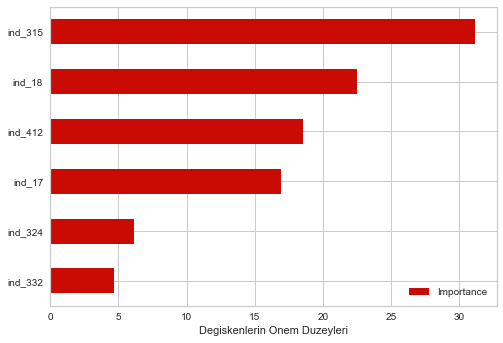

In [111]:
best_params = {}
rf = model.RF_Regression(X_train,X_test,y_train,y_test,best_params)

In [112]:
params = {'max_depth': list(range(1,10)),
            'max_features': [3,5,10,15],
            'n_estimators' : [10, 20, 50, 100, 200]}
best_params = model.Model_Tuning(X_train,y_train,params,rf)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 528 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 909 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 1357 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.8min finished


En iyi parametreler: {'max_depth': 9, 'max_features': 5, 'n_estimators': 200}


-----------------------------MSE--------------------
26.632125815690983


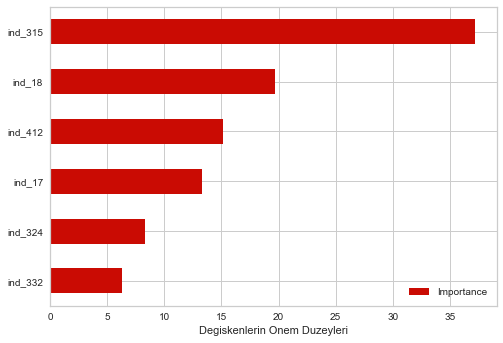

In [113]:
rf = model.RF_Regression(X_train,X_test,y_train,y_test,best_params)

# SVR

In [146]:
best_params = {}
svr = model.SVR(X_train,X_test,y_train,y_test,best_params)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
-----------------------------MSE--------------------
45.29812593876632


In [147]:
params = {"C": [0.01, 0.1,0.4,5,10,20,30,40,50]}
best_params = model.Model_Tuning(X_train,y_train,params,svr)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:   17.3s finished


En iyi parametreler: {'C': 50}


In [148]:
svr = model.SVR(X_train,X_test,y_train,y_test,best_params)

SVR(C=50, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
-----------------------------MSE--------------------
42.31474009131216


# KNeighborsRegressor

In [181]:
best_params = {}
knn = model.KNeighborsRegressor(X_train,X_test,y_train,y_test,best_params)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')
5
euclidean
-----------------------------MSE--------------------
34.27403258075868
k = 1 için RMSE değeri:  0.0 RMSE_CV değeri:  40.96589419987157
k = 2 için RMSE değeri:  20.483758330208584 RMSE_CV değeri:  36.26492364286292
k = 3 için RMSE değeri:  24.130806532442794 RMSE_CV değeri:  35.059758362408715
k = 4 için RMSE değeri:  26.064268523836493 RMSE_CV değeri:  34.41994216197461
k = 5 için RMSE değeri:  27.36560432312356 RMSE_CV değeri:  34.27299138212274
k = 6 için RMSE değeri:  28.28155570611161 RMSE_CV değeri:  33.99229775571409
k = 7 için RMSE değeri:  28.92746623497397 RMSE_CV değeri:  33.991878930954336
k = 8 için RMSE değeri:  29.435255364351928 RMSE_CV değeri:  33.83129657716594
k = 9 için RMSE değeri:  29.84481439760218 RMSE_CV değeri:  33.83059622008345
k = 10 için RMSE değeri:  30.2355282692

In [182]:
params = {'n_neighbors': np.arange(1,30,1)}
best_params = model.Model_Tuning(X_train,y_train,params,knn)

Fitting 10 folds for each of 29 candidates, totalling 290 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.3s


En iyi parametreler: {'n_neighbors': 9}


[Parallel(n_jobs=-1)]: Done 290 out of 290 | elapsed:    2.1s finished


In [183]:
knn = model.KNeighborsRegressor(X_train,X_test,y_train,y_test,best_params)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=9, p=2,
                    weights='uniform')
9
euclidean
-----------------------------MSE--------------------
34.60591205670963
k = 1 için RMSE değeri:  0.0 RMSE_CV değeri:  40.96589419987157
k = 2 için RMSE değeri:  20.483758330208584 RMSE_CV değeri:  36.26492364286292
k = 3 için RMSE değeri:  24.130806532442794 RMSE_CV değeri:  35.059758362408715
k = 4 için RMSE değeri:  26.064268523836493 RMSE_CV değeri:  34.41994216197461
k = 5 için RMSE değeri:  27.36560432312356 RMSE_CV değeri:  34.27299138212274
k = 6 için RMSE değeri:  28.28155570611161 RMSE_CV değeri:  33.99229775571409
k = 7 için RMSE değeri:  28.92746623497397 RMSE_CV değeri:  33.991878930954336
k = 8 için RMSE değeri:  29.435255364351928 RMSE_CV değeri:  33.83129657716594
k = 9 için RMSE değeri:  29.84481439760218 RMSE_CV değeri:  33.83059622008345
k = 10 için RMSE değeri:  30.2355282692

# KMEANS

In [321]:
pca=PCA()

pca = PCA(n_components=4)

X_reduced_train = pca.fit_transform(scale(X_train))
X_reduced_test = pca.fit_transform(scale(X_test))

In [323]:
pca_data = pca.fit_transform(scale(data))
pca_data = pd.DataFrame(pca_data)
np.cumsum(np.round(pca.explained_variance_ratio_, decimals = 4) * 100)

array([36.52, 48.82, 54.66, 59.08])

In [324]:
kmeans = KMeans(n_clusters = 4)
kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [325]:
k_fit = kmeans.fit(X_reduced_train)

k_fit.cluster_centers_

array([[ 0.45247642,  1.36945219,  0.11985877,  0.17916602],
       [-0.92371212, -0.17533811, -0.26208743,  0.04218519],
       [ 1.8631154 , -0.77247197, -1.01063771, -0.05212459],
       [ 0.92158799, -1.30549605,  2.12338082, -0.52196407]])

In [326]:
k_fit.labels_

array([0, 1, 0, ..., 1, 0, 3])

In [328]:
kumeler = k_fit.labels_

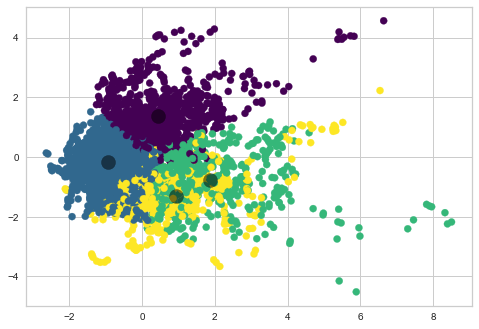

In [329]:

plt.scatter(X_reduced_train[:,0], X_reduced_train[:,1], c = kumeler, s = 50, cmap = "viridis")

merkezler = k_fit.cluster_centers_

plt.scatter(merkezler[:,0], merkezler[:,1], c = "black", s = 200, alpha = 0.5);

In [332]:
kmeans = KMeans(n_clusters = 4)
k_fit = kmeans.fit(X_reduced_train)
kumeler = k_fit.labels_
merkezler = kmeans.cluster_centers_

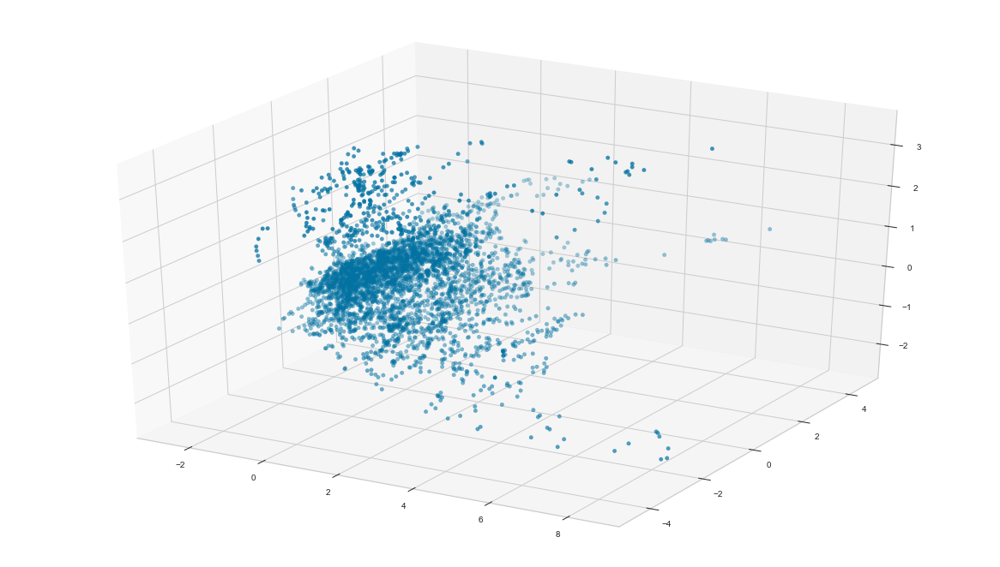

In [333]:
plt.rcParams['figure.figsize'] = (16, 9)
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X_reduced_train[:, 0], X_reduced_train[:, 1], X_reduced_train[:, 2]);

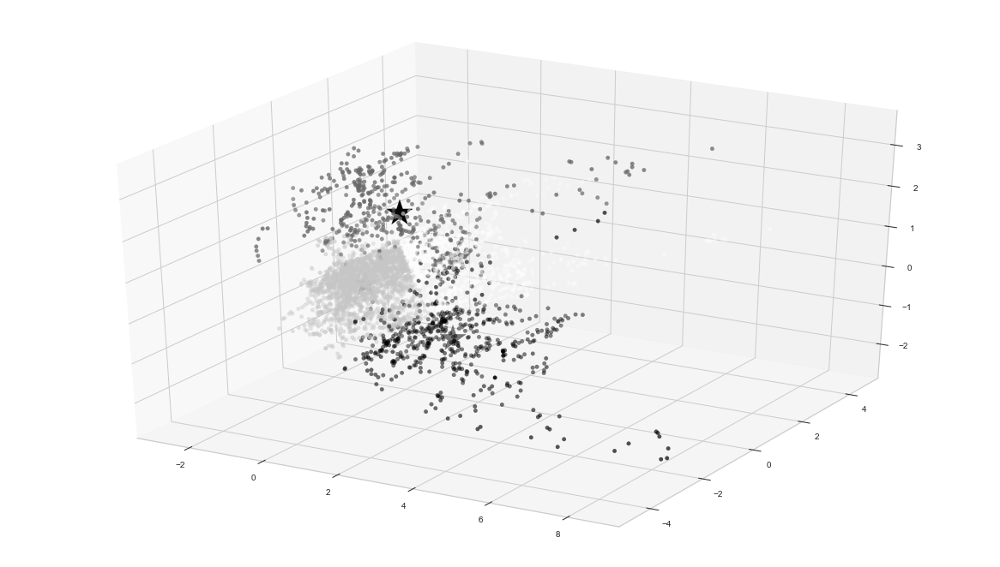

In [334]:

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X_reduced_train[:, 0], X_reduced_train[:, 1], X_reduced_train[:, 2], c=kumeler)
ax.scatter(merkezler[:, 0], merkezler[:, 1], merkezler[:, 2], 
           marker='*', 
           c='#050505', 
           s=1000);

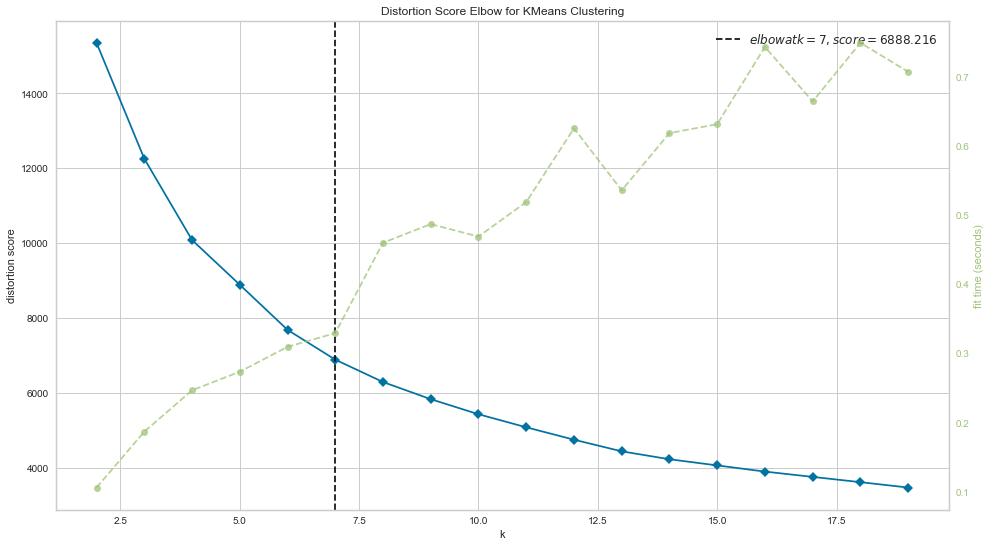

In [335]:
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,20))
visualizer.fit(X_reduced_train) 
visualizer.poof()

Küme sayısının düştüğü gözlemlenmektedir.

# Hiyerarşik Kümeleme

In [337]:
data= pd.read_excel("HW_Data_Set.xlsx").copy()
data.index = data.iloc[:,0]
data = data.iloc[:,133:]
data.head()

,20_target,50_target,90_target
ind_5,,,
19,15.135802,35.625252,36.997753
24,15.143348,35.643013,37.016198
30,15.146870,35.651301,-37.024805
37,15.153283,0.000000,-37.040483
41,-15.179065,-35.727079,-37.103503


In [339]:
hc_complete = linkage(data, "complete")
hc_average = linkage(data, "average")
hc_single = linkage(data, "single")

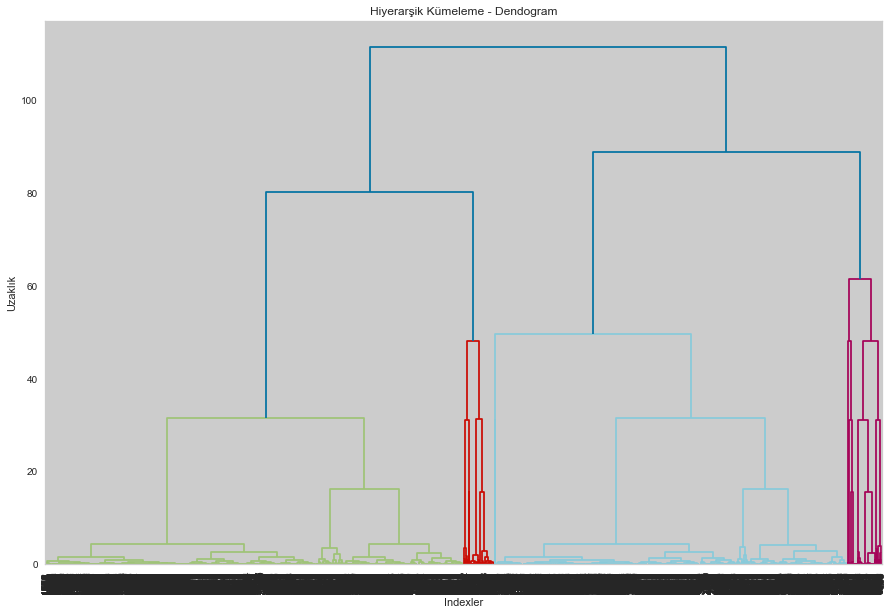

In [343]:
plt.figure(figsize=(15, 10))
plt.title('Hiyerarşik Kümeleme - Dendogram')
plt.xlabel('Indexler')
plt.ylabel('Uzaklık')
dendrogram(
    hc_complete,
    leaf_font_size=10
);

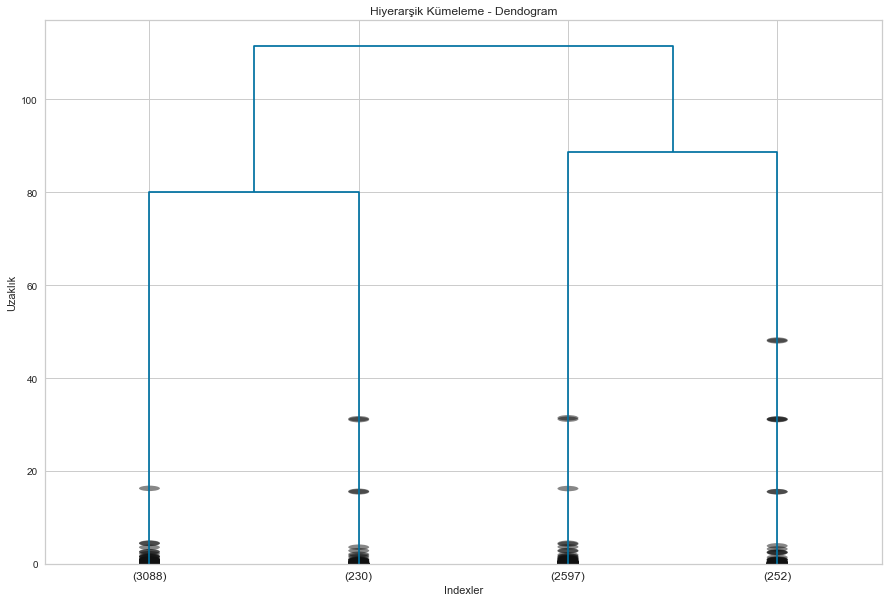

In [344]:
plt.figure(figsize=(15, 10))
plt.title('Hiyerarşik Kümeleme - Dendogram')
plt.xlabel('Indexler')
plt.ylabel('Uzaklık')
dendrogram(
    hc_complete,
    truncate_mode = "lastp",
    p = 4,
    show_contracted = True
);

# NaiveBayes

In [285]:
import pandas as pd
data1= pd.read_excel("HW_Data_Set.xlsx")
data = data1.copy()

In [286]:
for i in range(len(data["90_target"])):
    
    if i == 0 :
        data["90_target"][i]=0
    
    elif i < 0: 
    
        data["90_target"][i]=1
        
    else :
        
        data["90_target"][i]=2

In [287]:
data = data.replace('?',np.nan)
data = data.dropna()

In [288]:
y=data["90_target"]
X_=data.drop(["ind_109","50_target","90_target","20_target"],axis=1).astype('float64')

In [289]:
model = Model()

In [290]:
X_train,X_test,y_train,y_test= model.train_test_split(y,X)

Please enter shufle: 
X_train (4100, 9)
y_train (4100,)
X_test (1026, 9)
y_test (1026,)


In [291]:
nai = model.NaiveBayes(X_train,X_test,y_train,y_test)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)
Test başarı oranı
1.0
Train başarı oranı
0.9997560975609756
